# Transfer studies

In [2]:
from pathlib import Path

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import colors

import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats("pdf", "svg")

from pipoli.core import Dimension

In [3]:
DATA = Path() / "output" / "data" / "data-naive-similar-'m'-'L'-'g'-(-1, 1)-(-1, 1)-(0, 0)-50-50-1-10.pkl.gz"

In [4]:
all_data = pd.read_pickle(DATA)

In [34]:
BASE = all_data.attrs["base"]
type(all_data.attrs)

dict

## Similar transfer study

### Data processing

In [7]:
BASE_DIMENSIONS = [
    M := Dimension([1, 0, 0]),
    L := Dimension([0, 1, 0]),
    T := Dimension([0, 0, 1]),
]
Unit = Dimension([0, 0, 0])

In [8]:
process_df = all_data[["context", "b1", "b2", "b3", "infos"]].sort_values(["b1", "b2", "b3"])

In [9]:
process_df

,context,b1,b2,b3,infos
cheetah-m-L-g_1.400e+00_5.000e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.050000,9.81,"[[{'x_position': 0.03805300267176542, 'x_veloc..."
cheetah-m-L-g_1.400e+00_5.493e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.054927,9.81,"[[{'x_position': -0.011572975368207629, 'x_vel..."
cheetah-m-L-g_1.400e+00_6.034e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.060340,9.81,"[[{'x_position': 0.03257286982372124, 'x_veloc..."
cheetah-m-L-g_1.400e+00_6.629e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.066286,9.81,"[[{'x_position': 0.09254035403936367, 'x_veloc..."
cheetah-m-L-g_1.400e+00_7.282e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.072817,9.81,"[[{'x_position': -0.07061821936635629, 'x_velo..."
...,...,...,...,...,...
cheetah-m-L-g_1.400e+02_3.433e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.433244,9.81,"[[{'x_position': 0.005669643835621841, 'x_velo..."
cheetah-m-L-g_1.400e+02_3.772e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.771560,9.81,"[[{'x_position': -0.01617545766378341, 'x_velo..."
cheetah-m-L-g_1.400e+02_4.143e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,4.143214,9.81,"[[{'x_position': -0.015674033378659948, 'x_vel..."
cheetah-m-L-g_1.400e+02_4.551e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,4.551491,9.81,"[[{'x_position': -0.12078606926725785, 'x_velo..."


In [ ]:
def extract_adim_reward_forward(infos, context, base):
    forward_reward_adim, _ = context.make_transforms([L / T], base)
    reward = np.vectorize(lambda infs: forward_reward_adim(infs["reward_forward"])[0])
    return reward(infos)

def extract_adim_reward_ctrl(infos, context, base):
    control_cost_adim, _ = context.make_transforms([M**2*L**4/T**4], base)
    reward = np.vectorize(lambda infs: control_cost_adim(infs["reward_ctrl"])[0])
    return reward(infos)


extract_adim_reward_ctrl(all_data["infos"].iat[0][0, 0], all_data["context"].iat[0], BASE)

array(-7.08380203e-05)

In [30]:
original_context = process_df["context"].loc["original"]

process_df["adimensional_distance_to_original"] = process_df["context"].map(lambda c: c.adimensional_distance(original_context, BASE))
process_df["cosine_similarity_to_original"] = process_df["context"].map(lambda c: c.cosine_similarity(original_context))
process_df["rewards_forward"] = process_df.apply(lambda row: extract_adim_reward_forward(row["infos"], row["context"], BASE), axis=1)
process_df["rewards_ctrl"] = process_df.apply(lambda row: extract_adim_reward_ctrl(row["infos"], row["context"], BASE), axis=1)
process_df["totals_reward_forward"] = process_df["rewards_forward"].map(lambda l: np.array([ep.sum() for ep in l]))
process_df["totals_reward_ctrl"] = process_df["rewards_ctrl"].map(lambda l: np.array([ep.sum() for ep in l]))
process_df["totals_reward"] = process_df.apply(lambda row: row["totals_reward_forward"] + row["totals_reward_ctrl"], axis=1)
process_df["mean_total_reward_forward"] = process_df["totals_reward_forward"].map(lambda t: t.mean())
process_df["mean_total_reward_ctrl"] = process_df["totals_reward_ctrl"].map(lambda t: t.mean())
process_df["mean_total_reward"] = process_df["totals_reward"].map(lambda t: t.mean())
process_df["std_total_reward_forward"] = process_df["totals_reward_forward"].map(lambda t: t.std())
process_df["std_total_reward_ctrl"] = process_df["totals_reward_ctrl"].map(lambda t: t.std())
process_df["std_total_reward"] = process_df["totals_reward"].map(lambda t: t.std())
process_df["mean_total_reward_difference"] = process_df["mean_total_reward"] - process_df["mean_total_reward"].loc["original"]

In [13]:
process_df

,context,b1,b2,b3,infos,adimensional_distance_to_original,cosine_similarity_to_original,rewards_forward,rewards_ctrl,totals_reward_forward,totals_reward_ctrl,totals_reward,mean_total_reward_forward,mean_total_reward_ctrl,mean_total_reward,std_total_reward_forward,std_total_reward_ctrl,std_total_reward,mean_total_reward_difference
cheetah-m-L-g_1.400e+00_5.000e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.050000,9.81,"[[{'x_position': 0.03805300267176542, 'x_veloc...",0.000000e+00,0.396211,"[[-0.10371755611555158, -0.12063920972213647, ...","[[-0.8337056857729909, -0.5781214043370967, -0...","[-12.444528122577935, -10.95978074167067, 13.5...","[-772.5286883589681, -747.2520924885927, -363....","[-784.973216481546, -758.2118732302633, -349.7...",3.388510,-530.993572,-527.605062,11.177794,2.124475e+02,223.114828,-8660.686013
cheetah-m-L-g_1.400e+00_5.493e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.054927,9.81,"[[{'x_position': -0.011572975368207629, 'x_vel...",8.355535e-17,0.426574,"[[0.043431742685528546, 0.0745536059953587, 0....","[[-0.3024384761395009, -0.6475773280832782, -0...","[17.825539397358142, 26.06564021260497, 17.353...","[-108.46397960893728, -528.2990391492044, -179...","[-90.63844021157914, -502.23339893659943, -162...",6.452289,-399.209475,-392.757186,15.008933,1.851481e+02,194.377448,-8525.838138
cheetah-m-L-g_1.400e+00_6.034e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.060340,9.81,"[[{'x_position': 0.03257286982372124, 'x_veloc...",6.482576e-16,0.458417,"[[0.10097789005393482, 0.09645399745778936, 0....","[[-0.5021426160915214, -0.42046069626657745, -...","[14.780980064079529, 19.66285113145908, 16.910...","[-132.49310948022992, -108.37039652745658, -19...","[-117.71212941615039, -88.7075453959975, -179....",7.772277,-270.195498,-262.423221,11.886441,1.678568e+02,178.942824,-8395.504173
cheetah-m-L-g_1.400e+00_6.629e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.066286,9.81,"[[{'x_position': 0.09254035403936367, 'x_veloc...",1.003144e-16,0.491555,"[[0.09757715016169363, 0.15010169987631866, 0....","[[-0.29183715816945455, -0.26863815460740337, ...","[14.574567869768934, 17.14830881356805, 6.3580...","[-47.64372816657581, -124.01741294851769, -151...","[-33.06916029680688, -106.86910413494964, -144...",13.174145,-140.103286,-126.929141,9.832050,8.948063e+01,93.917205,-8260.010093
cheetah-m-L-g_1.400e+00_7.282e-02_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",1.4,0.072817,9.81,"[[{'x_position': -0.07061821936635629, 'x_velo...",1.345501e-16,0.525744,"[[0.003694501873405349, -0.04373768157673005, ...","[[-0.3497518099493595, -0.35479596567866967, -...","[10.255981463175456, 23.85897932174639, 8.5033...","[-106.42989506318409, -162.63847202588562, -10...","[-96.17391360000863, -138.77949270413922, -97....",15.798508,-112.124896,-96.326388,6.582825,3.727487e+01,34.631546,-8229.407340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cheetah-m-L-g_1.400e+02_3.433e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.433244,9.81,"[[{'x_position': 0.005669643835621841, 'x_velo...",7.473417e-17,0.998420,"[[-0.008214173463384133, -0.002319254573320989...","[[-9.737276391904261e-09, -1.4773389876309967e...","[0.06236968604676885, -0.8178554816305292, -0....","[-2.6526915360944082e-05, -2.6530630146032897e...","[0.06234315913140791, -0.8178820122606753, -0....",-0.291945,-0.000027,-0.291971,0.384649,4.882765e-09,0.384649,-8133.372923
cheetah-m-L-g_1.400e+02_3.772e+00_9.810e+00,"Context([Dimension([1 0 0]), Dimension([0 1 0]...",140.0,3.771560,9.81,"[[{'x_position': -0.01617545766378341, 'x_velo...",1.734723e-18,0.998274,"[[-0.01047660059522449, -0.01970586427438221, ...","[[-1.3073723363487498e-08, -1.2588229382802024...","[-1.4540361662990213, -0.3360689510830275, -0....","[-2.2082087199718667e-05, -2.2095827811553414e...","[-1.454058248386221, -0.3360

In [14]:
score_df = process_df[["b1", "b2", "b3", "adimensional_distance_to_original", "cosine_similarity_to_original", "mean_total_reward", "std_total_reward", "mean_total_reward_forward", "std_total_reward_forward", "mean_total_reward_ctrl", "std_total_reward_ctrl"]].rename(columns=dict(zip(["b1", "b2", "b3"], BASE)))

### Visualization

In [15]:
def heatmap(df, x, y, C, /, title=None, xlabel=None, ylabel=None, zlabel=None, xscale="log", yscale="log", **kwargs):
    xs = np.array(df[x])
    ys = np.array(df[y])
    Cs = np.array(df[C])

    Nx = np.sqrt(xs.size).astype(int)
    Ny = np.sqrt(ys.size).astype(int)
    X = xs.reshape((Nx, Ny))
    Y = ys.reshape((Nx, Ny))
    Z = Cs.reshape((Nx, Ny))

    plt.figure()
    plt.pcolormesh(X, Y, Z, **kwargs)
    plt.xscale(xscale)
    plt.yscale(yscale)
    plt.title(title or "")
    plt.xlabel(xlabel or x)
    plt.ylabel(ylabel or y)
    plt.colorbar(label=zlabel or C)

In [16]:
score_df

,m,L,g,adimensional_distance_to_original,cosine_similarity_to_original,mean_total_reward,std_total_reward,mean_total_reward_forward,std_total_reward_forward,mean_total_reward_ctrl,std_total_reward_ctrl
cheetah-m-L-g_1.400e+00_5.000e-02_9.810e+00,1.4,0.050000,9.81,0.000000e+00,0.396211,-527.605062,223.114828,3.388510,11.177794,-530.993572,2.124475e+02
cheetah-m-L-g_1.400e+00_5.493e-02_9.810e+00,1.4,0.054927,9.81,8.355535e-17,0.426574,-392.757186,194.377448,6.452289,15.008933,-399.209475,1.851481e+02
cheetah-m-L-g_1.400e+00_6.034e-02_9.810e+00,1.4,0.060340,9.81,6.482576e-16,0.458417,-262.423221,178.942824,7.772277,11.886441,-270.195498,1.678568e+02
cheetah-m-L-g_1.400e+00_6.629e-02_9.810e+00,1.4,0.066286,9.81,1.003144e-16,0.491555,-126.929141,93.917205,13.174145,9.832050,-140.103286,8.948063e+01
cheetah-m-L-g_1.400e+00_7.282e-02_9.810e+00,1.4,0.072817,9.81,1.345501e-16,0.525744,-96.326388,34.631546,15.798508,6.582825,-112.124896,3.727487e+01
...,...,...,...,...,...,...,...,...,...,...,...
cheetah-m-L-g_1.400e+02_3.433e+00_9.810e+00,140.0,3.433244,9.81,7.473417e-17,0.998420,-0.291971,0.384649,-0.291945,0.384649,-0.000027,4.882765e-09
cheetah-m-L-g_1.400e+02_3.772e+00_9.810e+00,140.0,3.771560,9.81,1.734723e-18,0.998274,-0.417766,0.396059,-0.417744,0.396059,-0.000022,4.510992e-09
cheetah-m-L-g_1.400e+02_4.143e+00_9.810e+00,140.0,4.143214,9.81,6.286883e-16,0.998111,-0.292170,0.296355,-0.292152,0.296355,-0.000018,4.617560e-09
cheetah-m-L-g_1.400e+02_4.551e+00_9.810e+00,140.0,4.551491,9.81,5.649555e-16,0.997932,-0.287675,0.226675,-0.287660,0.226675,-0.000015,2.134153e-09


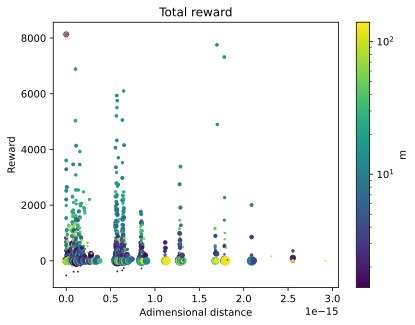

In [17]:
viz_df = score_df.sort_values(["adimensional_distance_to_original"])

viz_df.plot.scatter(
    x="adimensional_distance_to_original",
    y="mean_total_reward",
    s=viz_df["L"]*15,
    c="m",
    xlabel="Adimensional distance",
    ylabel="Reward",
    title="Total reward",
    legend=False,
    # cmap="coolwarm",
    norm="log", #colors.CenteredNorm(vcenter=original_context.value("m"))
    # logx=True,
)
plt.scatter(0, score_df.loc["original"]["mean_total_reward"], marker="o", s=25, facecolor="none", edgecolors="r")

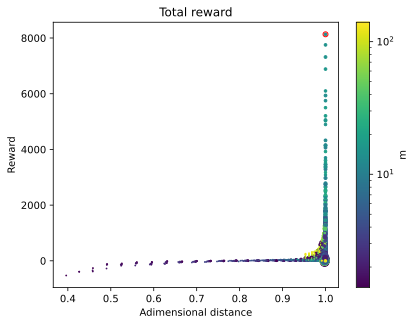

In [18]:
viz_df = score_df.sort_values(["adimensional_distance_to_original"])

viz_df.plot.scatter(
    x="cosine_similarity_to_original",
    y="mean_total_reward",
    s=viz_df["L"]*15,
    c="m",
    xlabel="Adimensional distance",
    ylabel="Reward",
    title="Total reward",
    legend=False,
    # cmap="coolwarm",
    norm="log", #colors.CenteredNorm(vcenter=original_context.value("m"))
    # logx=True,
)
plt.scatter(1, score_df.loc["original"]["mean_total_reward"], marker="o", s=25, facecolor="none", edgecolors="r")

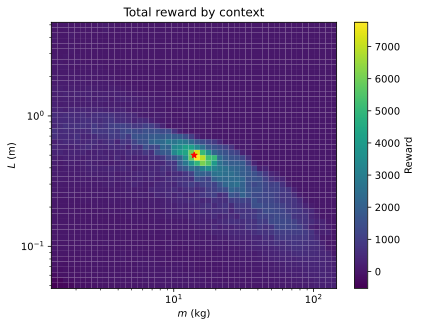

In [25]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "mean_total_reward",
    title="Total reward by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    # norm=colors.TwoSlopeNorm(0), #"linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

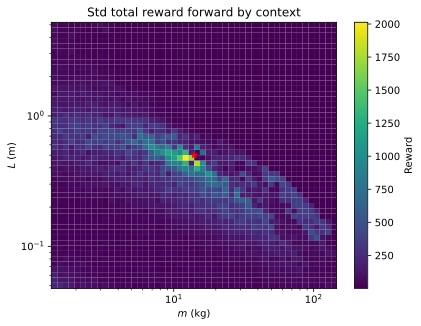

In [20]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "std_total_reward",
    title="Std total reward forward by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    # norm=colors.TwoSlopeNorm(0), #"linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

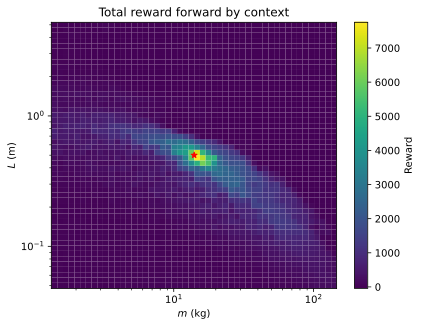

In [21]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "mean_total_reward_forward",
    title="Total reward forward by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    # norm=colors.TwoSlopeNorm(0), #"linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

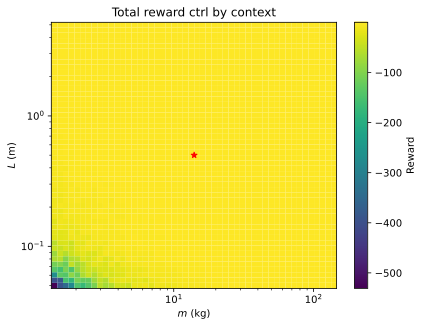

In [31]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "mean_total_reward_ctrl",
    title="Total reward ctrl by context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    norm="linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

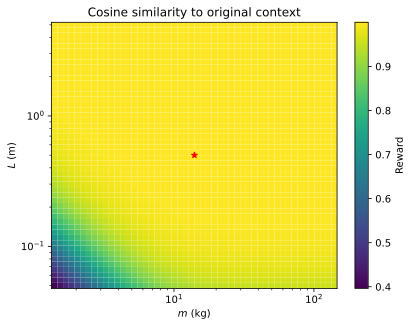

In [33]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "cosine_similarity_to_original",
    title="Cosine similarity to original context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    norm="linear",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")

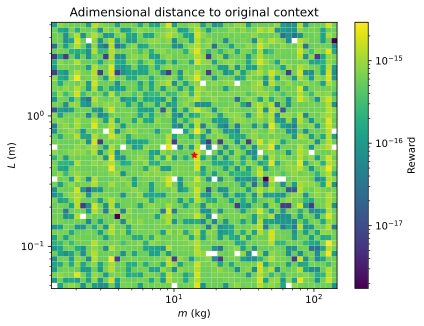

In [24]:
heatmap(
    score_df.drop("original").sort_values(["m", "L"]),
    "m",
    "L",
    "adimensional_distance_to_original",
    title="Adimensional distance to original context",
    xlabel="$m$ (kg)",
    ylabel="$L$ (m)",
    zlabel="Reward",
    norm="log",
    # cmap="coolwarm",
    # xscale="linear",
    # yscale="linear",
)
plt.scatter(original_context.value("m"), original_context.value("L"), c="r", marker="*")